In [1]:
import os
from pathlib import Path

DATA_DIR = Path("../data")

print("Data folder exists:", DATA_DIR.exists())

for root, dirs, files in os.walk(DATA_DIR):
    level = root.replace(str(DATA_DIR), "").count(os.sep)
    indent = "    " * level

    print(f"{indent}{os.path.basename(root)}/")

    for file in files[:10]:
        print(f"{indent}    {file}")

Data folder exists: True
data/
    ODAQ/
        DE_systems_info.xls
        _detailed_license.csv
        _license_disclaimer.txt
        listening_test_instructions/
            listening_test_instructions_english.docx
            listening_test_instructions_german.docx
        ODAQ_DE_raw_outputs/
            DE_CosmosLandromat_remix1_LD6/
                Cocktail_mid.wav
                DeepFilterNet2_mid.wav
                OpenUnmix_mid.wav
                PSM_quantize_mask.wav
                reference.wav
                TFC_TDF_U_Net_mid.wav
            DE_CosmosLandromat_remix2_LD9/
                Cocktail_mid.wav
                DeepFilterNet2_mid.wav
                OpenUnmix_mid.wav
                PSM_quantize_mask.wav
                reference.wav
                TFC_TDF_U_Net_mid.wav
            DE_CosmosLandromat_remix3_LD3/
                Cocktail_mid.wav
                DeepFilterNet2_mid.wav
                OpenUnmix_mid.wav
                PSM_quantize_mask.wav
 

In [2]:
from pathlib import Path

DATA_DIR = Path("../data/ODAQ")

for ext in ["*.csv", "*.xls", "*.xlsx", "*.xml"]:
    files = list(DATA_DIR.rglob(ext))

    print(f"\n{ext} : {len(files)} files")

    for f in files[:20]:
        print(f)


*.csv : 2 files
..\data\ODAQ\_detailed_license.csv
..\data\ODAQ\ODAQ_listening_test\ODAQ_results.csv

*.xls : 1 files
..\data\ODAQ\DE_systems_info.xls

*.xlsx : 0 files

*.xml : 26 files
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-01_125454_DEID256.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-04_135155_DEID337.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-07_163949_DEID1.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-11_105545_DEID3.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-11_135139_USLA08.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-11_162506_DEID1115.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-14_095636_DEID44.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-14_153612_DEID4.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-15_172605_USLG04.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-17_102628_USLA05.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-17_142434_USLA07.xml
..\data\ODAQ\ODAQ_listening_test\ODAQ_2023-08-18_123835_USLA01.xml
..\data

In [3]:
wav_files = list(DATA_DIR.rglob("*.wav"))

print("Number of WAV files:", len(wav_files))

for f in wav_files[:10]:
    print(f)

Number of WAV files: 377
..\data\ODAQ\ODAQ_unprocessed\01b_trumpet.wav
..\data\ODAQ\ODAQ_unprocessed\02_violin.wav
..\data\ODAQ\ODAQ_unprocessed\04_choral.wav
..\data\ODAQ\ODAQ_unprocessed\11_guitar.wav
..\data\ODAQ\ODAQ_unprocessed\13_glockenspiel.wav
..\data\ODAQ\ODAQ_unprocessed\20c_accordion.wav
..\data\ODAQ\ODAQ_unprocessed\21_violin.wav
..\data\ODAQ\ODAQ_unprocessed\23_jazz.wav
..\data\ODAQ\ODAQ_unprocessed\26_claves.wav
..\data\ODAQ\ODAQ_unprocessed\27_castanets.wav


In [4]:
import pandas as pd
from pathlib import Path

RESULTS_PATH = Path(
    "../data/ODAQ/ODAQ_listening_test/ODAQ_results.csv"
)

results = pd.read_csv(
    RESULTS_PATH,
    sep=None,
    engine="python"
)

print("Shape:", results.shape)

print("\nColumns:")
print(results.columns.tolist())

print("\nFirst rows:")
display(results.head())

print("\nData types:")
print(results.dtypes)

print("\nMissing values:")
print(results.isna().sum())

Shape: (6240, 6)

Columns:
['score', 'method', 'condition', 'process', 'item', 'subject']

First rows:


,score,method,condition,process,item,subject
0,47.0,LP,LP3.5,LP35,LP_11_guitar,Subject 1: USLA08
1,5.0,LP,LP3.5,LP35,LP_11_guitar,Subject 2: DEID44
2,10.0,LP,LP3.5,LP35,LP_11_guitar,Subject 3: DEID1115
3,20.0,LP,LP3.5,LP35,LP_11_guitar,Subject 4: DEID337
4,30.0,LP,LP3.5,LP35,LP_11_guitar,Subject 5: USLA06



Data types:
score        float64
method        object
condition     object
process       object
item          object
subject       object
dtype: object

Missing values:
score        0
method       0
condition    0
process      0
item         0
subject      0
dtype: int64


In [5]:
print("Number of rows:", len(results))

for col in results.columns:
    print(
        col,
        "→ unique values:",
        results[col].nunique()
    )

Number of rows: 6240
score → unique values: 101
method → unique values: 6
condition → unique values: 8
process → unique values: 33
item → unique values: 30
subject → unique values: 26


In [6]:
stimulus_counts = (
    results
    .groupby(["item", "condition"])
    .size()
)

print("Number of unique item-condition pairs:",
      len(stimulus_counts))

print("\nNumber of ratings per stimulus:")
print(stimulus_counts.value_counts())

Number of unique item-condition pairs: 240

Number of ratings per stimulus:
26    240
Name: count, dtype: int64


In [7]:
check = (
    results
    .groupby(["item", "condition"])
    [["method", "process"]]
    .nunique()
)

print(check.max())

method     1
process    1
dtype: int64


In [8]:
scores_df = (
    results
    .groupby(
        ["item", "condition", "method", "process"],
        as_index=False
    )
    .agg(
        score_mean=("score", "mean"),
        score_std=("score", "std"),
        score_median=("score", "median"),
        n_ratings=("score", "count")
    )
)

print(scores_df.shape)
display(scores_df.head())

(240, 8)


,item,condition,method,process,score_mean,score_std,score_median,n_ratings
0,DE_CosmosLandromat_remix1_LD6,LP3.5,DE,LP35,19.230769,11.772197,20.0,26
1,DE_CosmosLandromat_remix1_LD6,LP7,DE,LP70,44.153846,21.528943,40.5,26
2,DE_CosmosLandromat_remix1_LD6,Q1,DE,OpenUnmix_mid,18.346154,9.616412,16.0,26
3,DE_CosmosLandromat_remix1_LD6,Q2,DE,TFC_TDF_U_Net_mid,26.769231,15.092535,22.0,26
4,DE_CosmosLandromat_remix1_LD6,Q3,DE,Cocktail_mid,42.576923,22.409236,39.0,26


In [9]:
print(len(stimulus_counts))
print(stimulus_counts.value_counts())


240
26    240
Name: count, dtype: int64


In [10]:
scores_df = (
    results
    .groupby(
        ["item", "condition", "method", "process"],
        as_index=False
    )
    .agg(
        score_mean=("score", "mean"),
        score_std=("score", "std"),
        score_median=("score", "median"),
        n_ratings=("score", "count")
    )
)

print(scores_df.shape)
display(scores_df.head(10))

(240, 8)


,item,condition,method,process,score_mean,score_std,score_median,n_ratings
0,DE_CosmosLandromat_remix1_LD6,LP3.5,DE,LP35,19.230769,11.772197,20.0,26
1,DE_CosmosLandromat_remix1_LD6,LP7,DE,LP70,44.153846,21.528943,40.5,26
2,DE_CosmosLandromat_remix1_LD6,Q1,DE,OpenUnmix_mid,18.346154,9.616412,16.0,26
3,DE_CosmosLandromat_remix1_LD6,Q2,DE,TFC_TDF_U_Net_mid,26.769231,15.092535,22.0,26
4,DE_CosmosLandromat_remix1_LD6,Q3,DE,Cocktail_mid,42.576923,22.409236,39.0,26
5,DE_CosmosLandromat_remix1_LD6,Q4,DE,DeepFilterNet2_mid,53.192308,19.947971,55.0,26
6,DE_CosmosLandromat_remix1_LD6,Q5,DE,PSM_quantize_mask,73.115385,22.756673,76.0,26
7,DE_CosmosLandromat_remix1_LD6,Ref,DE,reference,99.423077,2.941742,100.0,26
8,DE_CosmosLandromat_remix3_LD3,LP3.5,DE,LP35,21.423077,11.771739,20.0,26
9,DE_CosmosLandromat_remix3_LD3,LP7,DE,LP70,40.653846,20.399887,35.5,26


In [11]:
print("Methods:")
print(scores_df["method"].unique())

print("\nConditions:")
print(scores_df["condition"].unique())

print("\nProcesses:")
print(scores_df["process"].unique())

print("\nItems:")
print(scores_df["item"].unique())

Methods:
['DE' 'LP' 'PE' 'SH' 'TM' 'UN']

Conditions:
['LP3.5' 'LP7' 'Q1' 'Q2' 'Q3' 'Q4' 'Q5' 'Ref']

Processes:
['LP35' 'LP70' 'OpenUnmix_mid' 'TFC_TDF_U_Net_mid' 'Cocktail_mid'
 'DeepFilterNet2_mid' 'PSM_quantize_mask' 'reference' 'LP50' 'LP90'
 'LP105' 'LP120' 'LP150' 'PE_4096_MS_NMR10' 'PE_2048_MS_NMR10'
 'PE_1024_MS_NMR10' 'PE_2048_MS_NMR16' 'PE_1024_MS_NMR16' 'SH70_MS'
 'SH50_MS' 'SH30_MS' 'SH20_MS' 'SH10_MS' 'TM3k' 'TM5k' 'TM7k' 'TM9k'
 'TM10.5k' 'UN3k' 'UN5k' 'UN7k' 'UN9k' 'UN10.5k']

Items:
['DE_CosmosLandromat_remix1_LD6' 'DE_CosmosLandromat_remix3_LD3'
 'DE_ElephantsDream_LD0' 'DE_Meridian_remix1_LD3' 'DE_Meridian_remix2_LD6'
 'DE_SitaSings_remix1_LD0' 'DE_SitaSings_remix2_LD6'
 'DE_female_speech_music_1_LD0' 'DE_female_speech_music_2_LD9'
 'DE_female_speech_music_3_LD3' 'LP_11_guitar' 'LP_23_jazz'
 'LP_AmateurOnPurpose' 'LP_CreatureFromTheBlackjackTable'
 'PE_27_castanets' 'PE_39_clapping' 'PE_AmateurOnPurpose'
 'PE_CreatureFromTheBlackjackTable' 'SH_04_choral' 'SH_13_glock

In [12]:
display(
    scores_df[
        ["item", "condition", "method", "process", "score_mean"]
    ].head(20)
)

,item,condition,method,process,score_mean
0,DE_CosmosLandromat_remix1_LD6,LP3.5,DE,LP35,19.230769
1,DE_CosmosLandromat_remix1_LD6,LP7,DE,LP70,44.153846
2,DE_CosmosLandromat_remix1_LD6,Q1,DE,OpenUnmix_mid,18.346154
3,DE_CosmosLandromat_remix1_LD6,Q2,DE,TFC_TDF_U_Net_mid,26.769231
4,DE_CosmosLandromat_remix1_LD6,Q3,DE,Cocktail_mid,42.576923
5,DE_CosmosLandromat_remix1_LD6,Q4,DE,DeepFilterNet2_mid,53.192308
6,DE_CosmosLandromat_remix1_LD6,Q5,DE,PSM_quantize_mask,73.115385
7,DE_CosmosLandromat_remix1_LD6,Ref,DE,reference,99.423077
8,DE_CosmosLandromat_remix3_LD3,LP3.5,DE,LP35,21.423077
9,DE_CosmosLandromat_remix3_LD3,LP7,DE,LP70,40.653846


In [13]:
from pathlib import Path

AUDIO_ROOT = Path(
    "../data/ODAQ/ODAQ_listening_test"
)

scores_df["audio_path"] = scores_df.apply(
    lambda row: AUDIO_ROOT / row["item"] / f"{row['process']}.wav",
    axis=1
)

scores_df["file_exists"] = scores_df["audio_path"].apply(
    lambda x: x.exists()
)

In [14]:
print("Total stimuli:", len(scores_df))

print(
    "Files found:",
    scores_df["file_exists"].sum()
)

print(
    "Files missing:",
    (~scores_df["file_exists"]).sum()
)

Total stimuli: 240
Files found: 240
Files missing: 0


In [15]:
display(
    scores_df[
        [
            "item",
            "condition",
            "process",
            "score_mean",
            "score_std",
            "audio_path",
            "file_exists"
        ]
    ].head(10)
)

,item,condition,process,score_mean,score_std,audio_path,file_exists
0,DE_CosmosLandromat_remix1_LD6,LP3.5,LP35,19.230769,11.772197,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
1,DE_CosmosLandromat_remix1_LD6,LP7,LP70,44.153846,21.528943,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
2,DE_CosmosLandromat_remix1_LD6,Q1,OpenUnmix_mid,18.346154,9.616412,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
3,DE_CosmosLandromat_remix1_LD6,Q2,TFC_TDF_U_Net_mid,26.769231,15.092535,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
4,DE_CosmosLandromat_remix1_LD6,Q3,Cocktail_mid,42.576923,22.409236,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
5,DE_CosmosLandromat_remix1_LD6,Q4,DeepFilterNet2_mid,53.192308,19.947971,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
6,DE_CosmosLandromat_remix1_LD6,Q5,PSM_quantize_mask,73.115385,22.756673,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
7,DE_CosmosLandromat_remix1_LD6,Ref,reference,99.423077,2.941742,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
8,DE_CosmosLandromat_remix3_LD3,LP3.5,LP35,21.423077,11.771739,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True
9,DE_CosmosLandromat_remix3_LD3,LP7,LP70,40.653846,20.399887,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...,True


In [16]:
scores_df[["score_mean", "score_std", "score_median"]].describe()

,score_mean,score_std,score_median
count,240.000000,240.000000,240.000000
mean,52.726442,15.274827,52.831250
std,27.978019,6.231788,29.542637
min,10.576923,0.000000,8.500000
25%,28.173077,11.806500,27.375000
50%,45.519231,15.842917,45.000000
75%,75.153846,20.254603,79.000000
max,100.000000,26.573787,100.000000


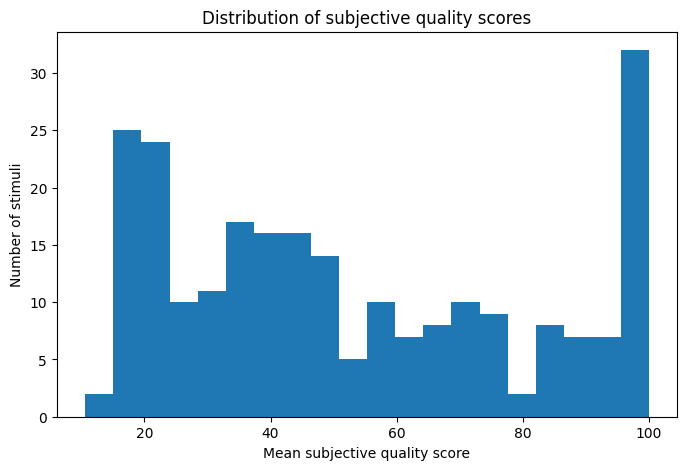

In [17]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))

plt.hist(
    scores_df["score_mean"],
    bins=20
)

plt.xlabel("Mean subjective quality score")
plt.ylabel("Number of stimuli")
plt.title("Distribution of subjective quality scores")

plt.show()

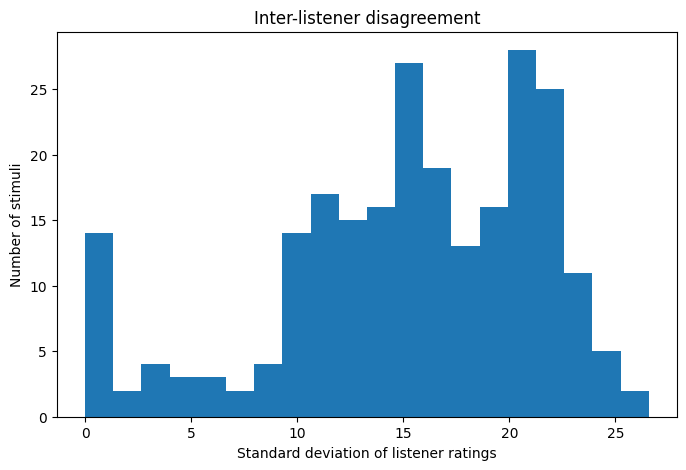

In [18]:
plt.figure(figsize=(8, 5))

plt.hist(
    scores_df["score_std"],
    bins=20
)

plt.xlabel("Standard deviation of listener ratings")
plt.ylabel("Number of stimuli")
plt.title("Inter-listener disagreement")

plt.show()

In [19]:
scores_df[
    [
        "item",
        "condition",
        "process",
        "score_mean",
        "score_std"
    ]
].sort_values(
    "score_std",
    ascending=False
).head(10)

,item,condition,process,score_mean,score_std
188,TM_02_violin,Q3,TM7k,59.615385,26.573787
221,UN_21_violin,Q4,UN9k,67.346154,25.326575
61,DE_female_speech_music_1_LD0,Q4,DeepFilterNet2_mid,46.615385,24.875815
187,TM_02_violin,Q2,TM5k,48.769231,24.811784
67,DE_female_speech_music_2_LD9,Q2,TFC_TDF_U_Net_mid,57.730769,24.671535
121,PE_39_clapping,LP7,LP70,44.769231,24.474162
173,SH_CreatureFromTheBlackjackTable,Q4,SH20_MS,55.961538,23.984129
59,DE_female_speech_music_1_LD0,Q2,TFC_TDF_U_Net_mid,40.500000,23.356798
109,LP_CreatureFromTheBlackjackTable,Q4,LP120,66.538462,23.312196
130,PE_AmateurOnPurpose,Q1,PE_4096_MS_NMR10,59.038462,23.273127


In [20]:
condition_stats = (
    scores_df
    .groupby("condition")
    ["score_mean"]
    .agg(["mean", "std", "count"])
    .sort_values("mean")
)

condition_stats

,mean,std,count
condition,,,
LP3.5,19.721795,2.235262,30
Q1,25.576923,12.679054,30
LP7,36.980769,5.492884,30
Q2,42.597436,15.798871,30
Q3,52.265385,13.337903,30
Q4,66.494872,16.127592,30
Q5,79.400000,13.663116,30
Ref,98.774359,1.740797,30


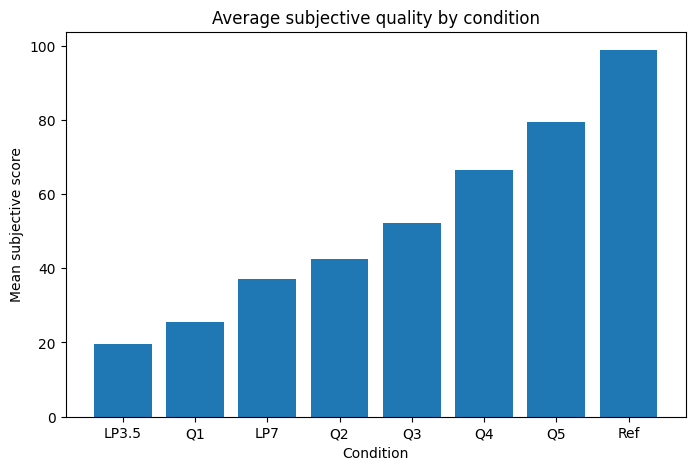

In [21]:
condition_mean = (
    scores_df
    .groupby("condition")["score_mean"]
    .mean()
    .sort_values()
)

plt.figure(figsize=(8, 5))

plt.bar(
    condition_mean.index,
    condition_mean.values
)

plt.xlabel("Condition")
plt.ylabel("Mean subjective score")
plt.title("Average subjective quality by condition")

plt.show()

In [22]:
reference_scores = scores_df[
    scores_df["condition"] == "Ref"
]

processed_scores = scores_df[
    scores_df["condition"] != "Ref"
]

print(
    "Reference mean:",
    reference_scores["score_mean"].mean()
)

print(
    "Processed mean:",
    processed_scores["score_mean"].mean()
)

Reference mean: 98.77435897435899
Processed mean: 46.1481684981685


In [23]:
item_name = "DE_CosmosLandromat_remix1_LD6"

selected = scores_df[
    (scores_df["item"] == item_name)
    &
    (scores_df["process"].isin([
        "LP35",
        "DeepFilterNet2_mid",
        "reference"
    ]))
][
    [
        "item",
        "process",
        "score_mean",
        "score_std",
        "audio_path"
    ]
]

display(selected)

,item,process,score_mean,score_std,audio_path
0,DE_CosmosLandromat_remix1_LD6,LP35,19.230769,11.772197,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...
5,DE_CosmosLandromat_remix1_LD6,DeepFilterNet2_mid,53.192308,19.947971,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...
7,DE_CosmosLandromat_remix1_LD6,reference,99.423077,2.941742,..\data\ODAQ\ODAQ_listening_test\DE_CosmosLand...


In [24]:
from IPython.display import Audio, display

for _, row in selected.iterrows():

    print(
        row["process"],
        "- score:",
        round(row["score_mean"], 2)
    )

    display(
        Audio(
            filename=str(row["audio_path"])
        )
    )

LP35 - score: 19.23


DeepFilterNet2_mid - score: 53.19


reference - score: 99.42


In [25]:
#charger les trois fichier 
import librosa
import numpy as np
import matplotlib.pyplot as plt

comparison = {}

for _, row in selected.iterrows():

    y, sr = librosa.load(
        row["audio_path"],
        sr=None,
        mono=True
    )

    comparison[row["process"]] = {
        "y": y,
        "sr": sr,
        "score": row["score_mean"]
    }

    print(
        row["process"],
        "| sr =", sr,
        "| duration =", round(len(y)/sr, 2),
        "| score =", round(row["score_mean"], 2)
    )

LP35 | sr = 48000 | duration = 10.0 | score = 19.23
DeepFilterNet2_mid | sr = 48000 | duration = 10.0 | score = 53.19
reference | sr = 48000 | duration = 10.0 | score = 99.42


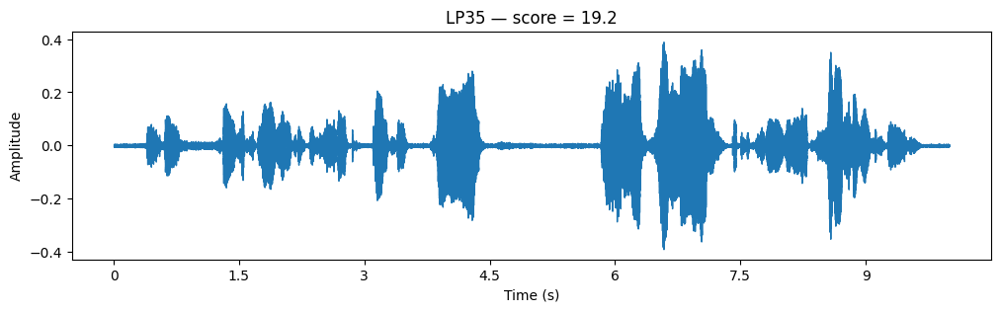

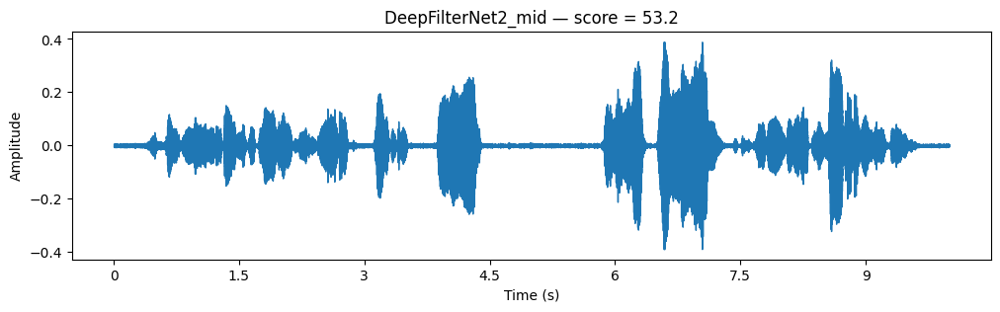

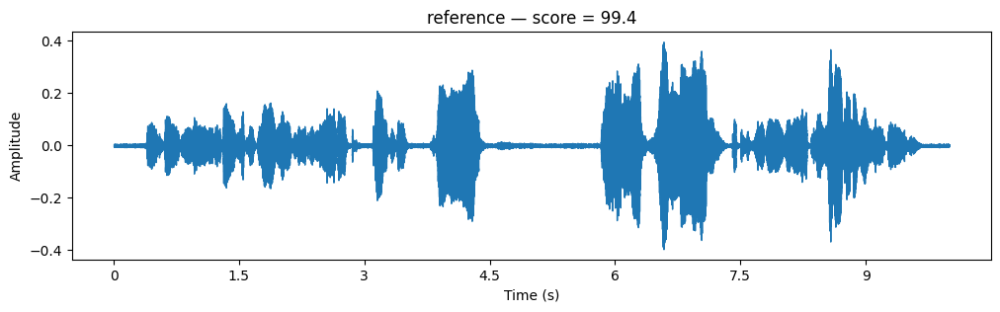

In [26]:
for process, data in comparison.items():

    y = data["y"]
    sr = data["sr"]
    score = data["score"]

    plt.figure(figsize=(12, 3))

    librosa.display.waveshow(
        y,
        sr=sr
    )

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(
        f"{process} — score = {score:.1f}"
    )

    plt.show()

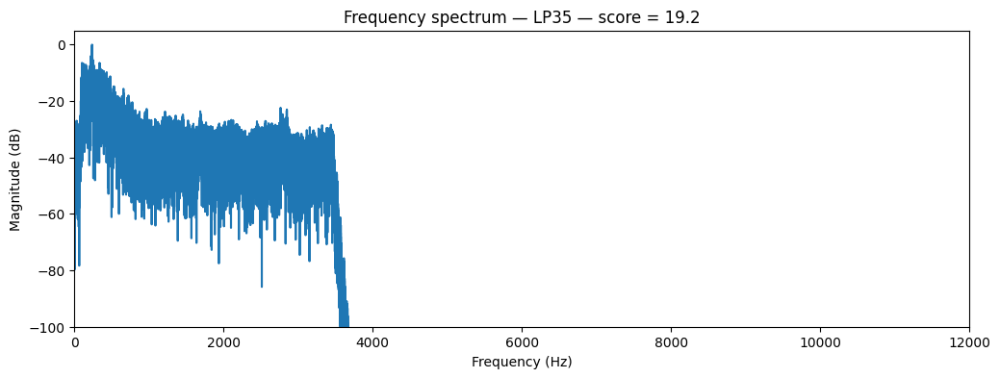

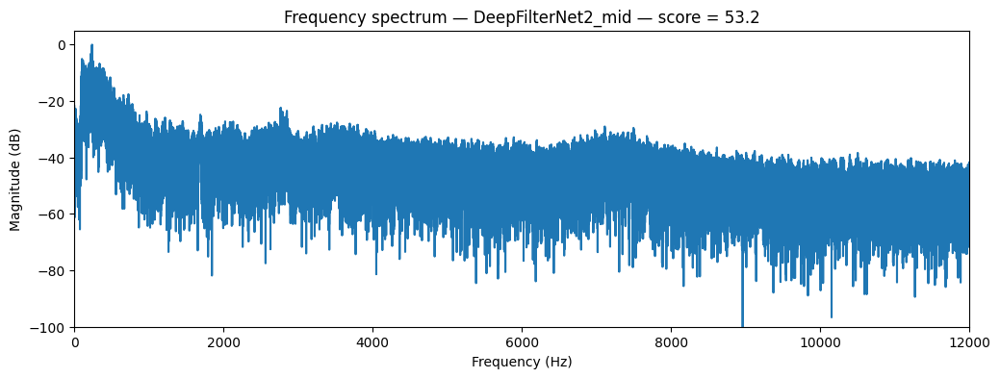

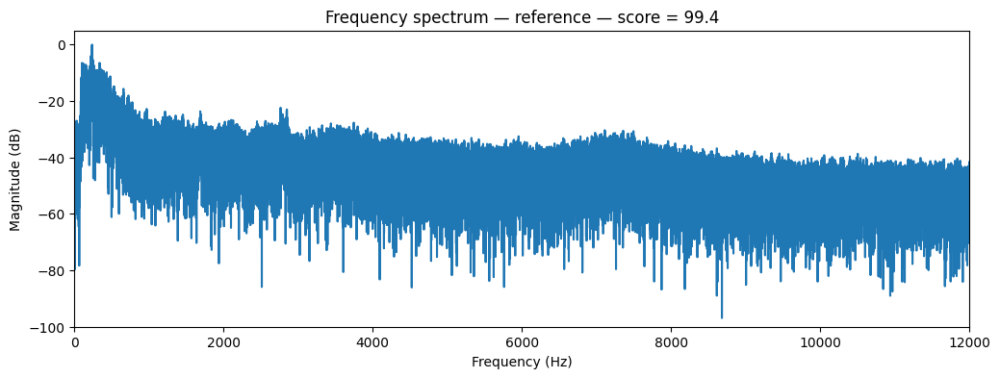

In [27]:
for process, data in comparison.items():

    y = data["y"]
    sr = data["sr"]
    score = data["score"]

    fft_values = np.fft.rfft(y)

    frequencies = np.fft.rfftfreq(
        len(y),
        d=1/sr
    )

    magnitude = np.abs(fft_values)

    # Conversion relative en dB
    magnitude_db = 20 * np.log10(
        magnitude / np.max(magnitude) + 1e-12
    )

    plt.figure(figsize=(12, 4))

    plt.plot(
        frequencies,
        magnitude_db
    )

    plt.xlim(0, 12000)
    plt.ylim(-100, 5)

    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude (dB)")
    plt.title(
        f"Frequency spectrum — {process} — score = {score:.1f}"
    )

    plt.show()

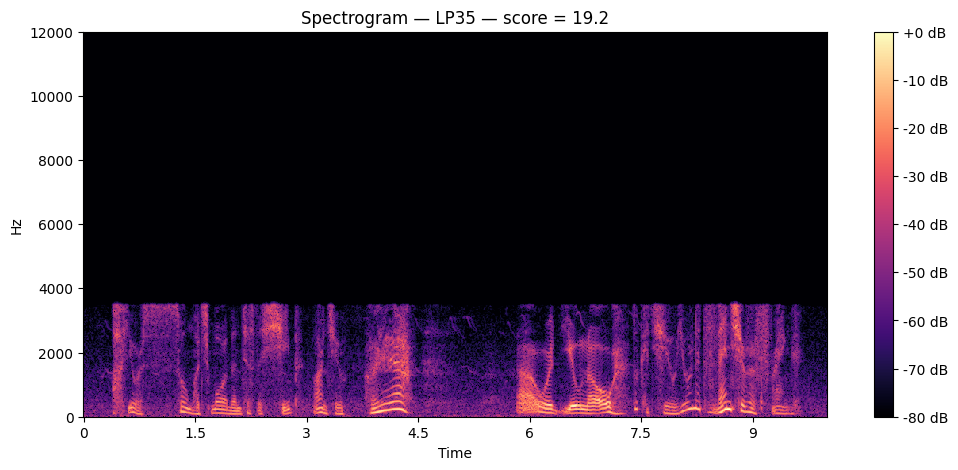

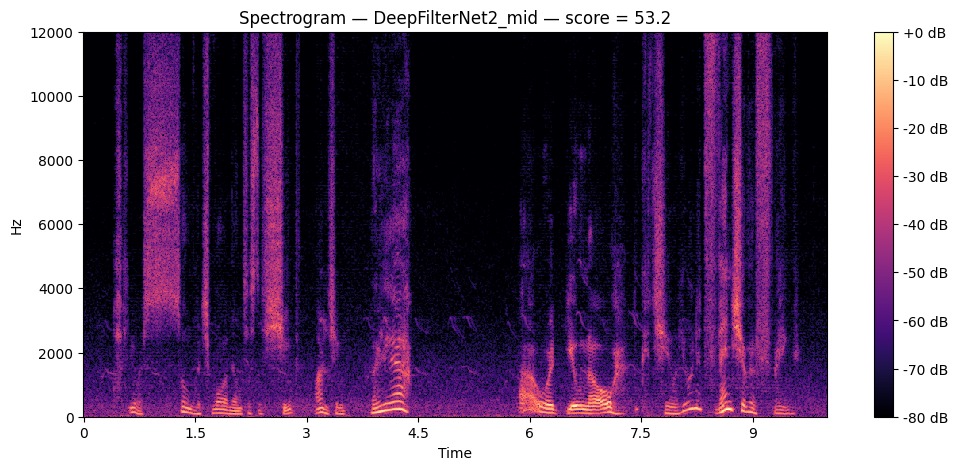

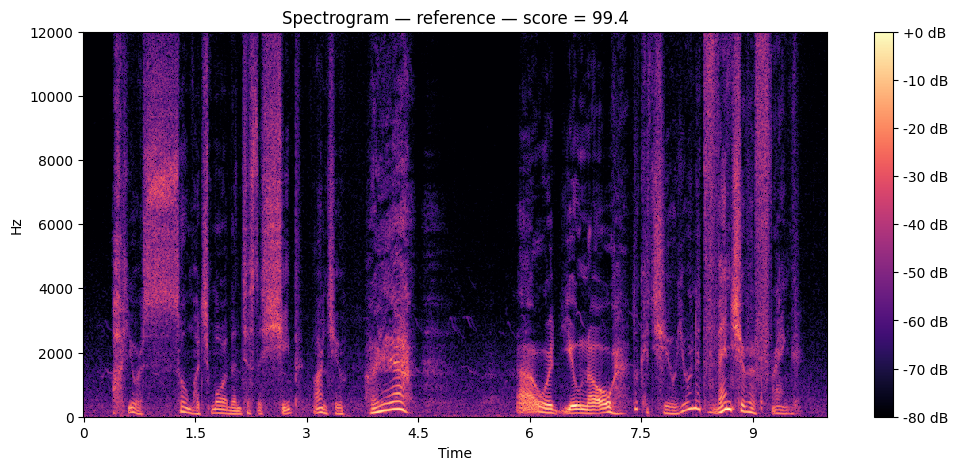

In [28]:
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

for process, data in comparison.items():

    y = data["y"]
    sr = data["sr"]
    score = data["score"]

    stft = librosa.stft(
        y,
        n_fft=2048,
        hop_length=512
    )

    stft_db = librosa.amplitude_to_db(
        np.abs(stft),
        ref=np.max
    )

    plt.figure(figsize=(12, 5))

    librosa.display.specshow(
        stft_db,
        sr=sr,
        hop_length=512,
        x_axis="time",
        y_axis="hz"
    )

    plt.ylim(0, 12000)

    plt.colorbar(format="%+2.0f dB")

    plt.title(
        f"Spectrogram — {process} — score = {score:.1f}"
    )

    plt.show()

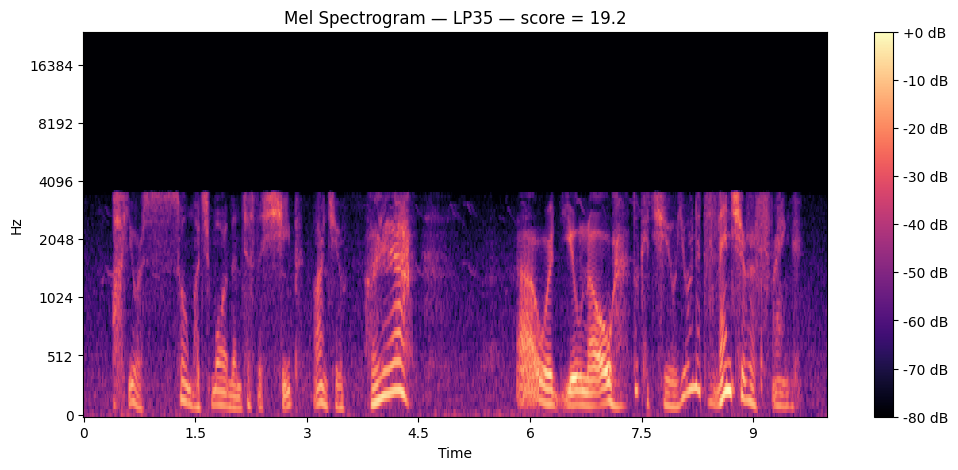

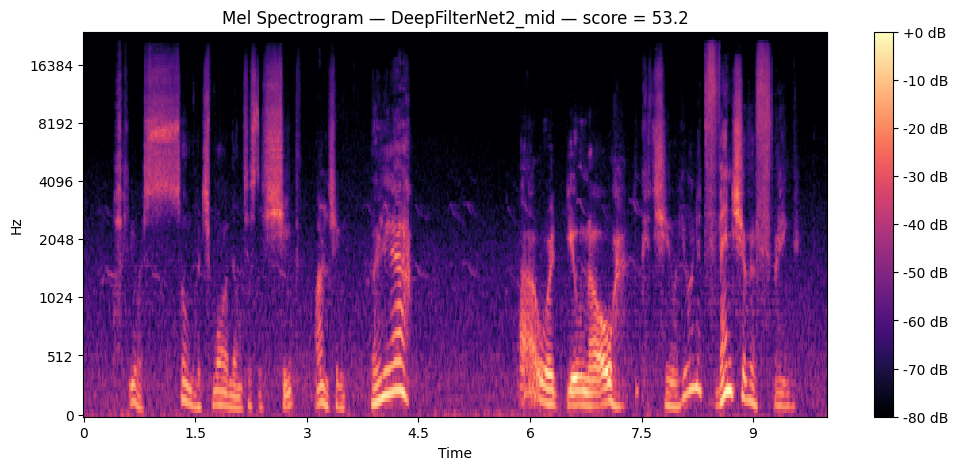

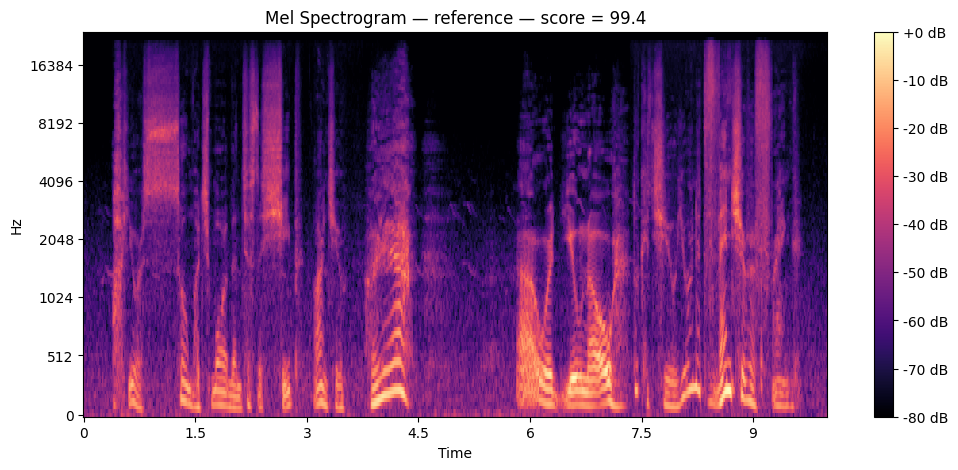

In [29]:
for process, data in comparison.items():

    y = data["y"]
    sr = data["sr"]
    score = data["score"]

    mel_spec = librosa.feature.melspectrogram(
        y=y,
        sr=sr,
        n_fft=2048,
        hop_length=512,
        n_mels=128
    )

    mel_db = librosa.power_to_db(
        mel_spec,
        ref=np.max
    )

    plt.figure(figsize=(12, 5))

    librosa.display.specshow(
        mel_db,
        sr=sr,
        hop_length=512,
        x_axis="time",
        y_axis="mel"
    )

    plt.colorbar(format="%+2.0f dB")

    plt.title(
        f"Mel Spectrogram — {process} — score = {score:.1f}"
    )

    plt.show()

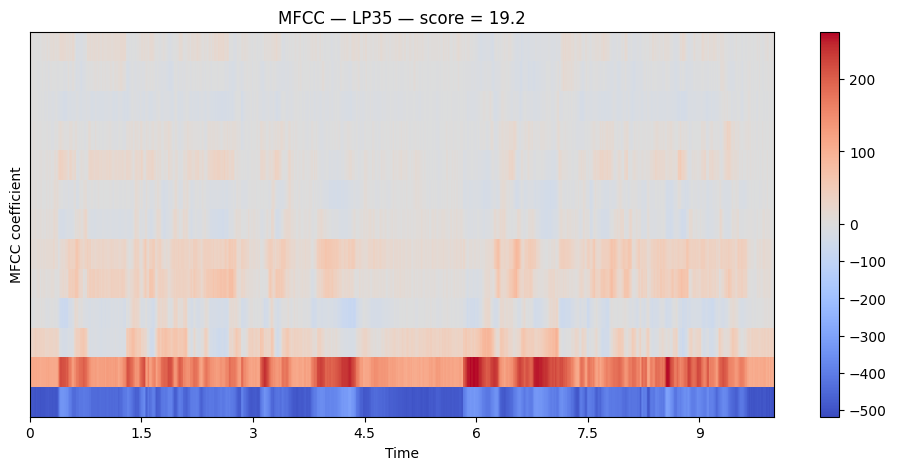

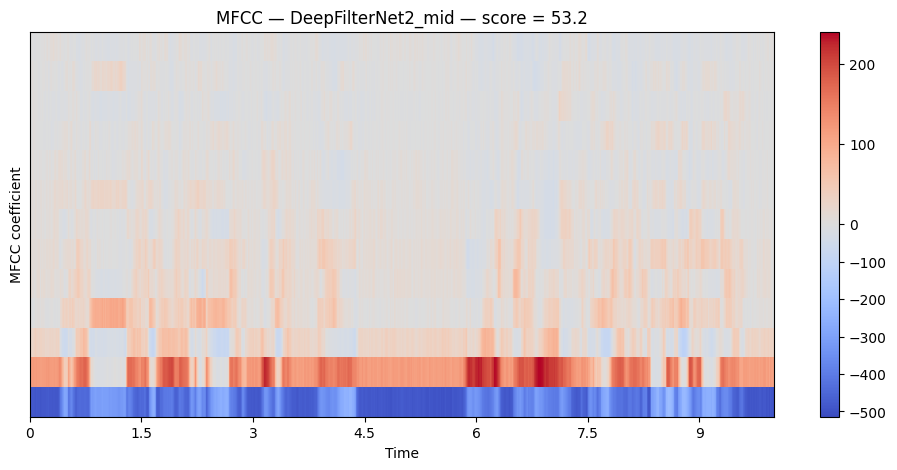

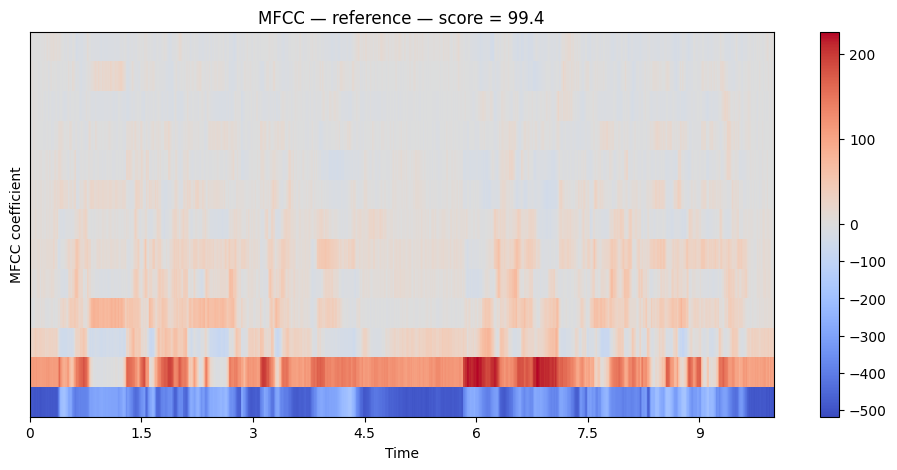

In [30]:
for process, data in comparison.items():

    y = data["y"]
    sr = data["sr"]
    score = data["score"]

    mfcc = librosa.feature.mfcc(
        y=y,
        sr=sr,
        n_mfcc=13,
        n_fft=2048,
        hop_length=512
    )

    plt.figure(figsize=(12, 5))

    librosa.display.specshow(
        mfcc,
        sr=sr,
        hop_length=512,
        x_axis="time"
    )

    plt.colorbar()

    plt.ylabel("MFCC coefficient")
    plt.title(
        f"MFCC — {process} — score = {score:.1f}"
    )

    plt.show()

In [31]:
for process, data in comparison.items():

    y = data["y"]
    sr = data["sr"]

    mfcc = librosa.feature.mfcc(
        y=y,
        sr=sr,
        n_mfcc=13,
        n_fft=2048,
        hop_length=512
    )

    print("\n", process)

    print(
        "MFCC mean:",
        np.round(
            np.mean(mfcc, axis=1),
            2
        )
    )

    print(
        "MFCC std:",
        np.round(
            np.std(mfcc, axis=1),
            2
        )
    )


 LP35
MFCC mean: [-426.37  162.12   20.97  -14.94   25.91   29.36   -3.71   -7.74    8.38
    1.89  -12.16   -5.69    2.72]
MFCC std: [48.77 42.09 30.91 22.27 21.07 15.88 15.44 12.51 13.08  7.29  9.11  8.39
  9.8 ]

 DeepFilterNet2_mid
MFCC mean: [-401.66  118.33   12.35   26.22   12.9    15.86    4.8     4.42   -1.35
    1.98   -3.96   -1.24   -5.23]
MFCC std: [76.69 61.69 38.5  28.44 18.29 16.59 14.89 12.93 10.17  8.63  8.77 10.05
  9.52]

 reference
MFCC mean: [-368.66  114.16    6.52   24.98    9.59   18.28    4.04    2.56   -3.74
    0.68   -6.2    -2.04   -6.86]
MFCC std: [86.82 55.54 35.88 24.64 18.5  15.   13.37 13.21 11.55  8.01  8.53  9.98
 10.18]


In [4]:
from pathlib import Path
import librosa
import numpy as np
import pandas as pd

# Paths
DATA_ROOT = Path("../data/ODAQ")
AUDIO_ROOT = DATA_ROOT / "ODAQ_listening_test"

# Recharger les scores si besoin
results = pd.read_csv(
    AUDIO_ROOT / "ODAQ_results.csv",
    sep=None,
    engine="python"
)

scores_df = (
    results
    .groupby(
        ["item", "condition", "method", "process"],
        as_index=False
    )
    .agg(
        score_mean=("score", "mean")
    )
)

# Même contenu audio utilisé dans notre analyse
item = "DE_CosmosLandromat_remix1_LD6"

processes = [
    "LP35",
    "DeepFilterNet2_mid",
    "reference"
]

comparison = {}

for process in processes:

    audio_path = (
        AUDIO_ROOT
        / item
        / f"{process}.wav"
    )

    y, sr = librosa.load(
        audio_path,
        sr=None,
        mono=True
    )

    score = scores_df.loc[
        (scores_df["item"] == item)
        & (scores_df["process"] == process),
        "score_mean"
    ].iloc[0]

    comparison[process] = {
        "y": y,
        "sr": sr,
        "score": score
    }

print(comparison.keys())

dict_keys(['LP35', 'DeepFilterNet2_mid', 'reference'])


C:\Users\user\AppData\Local\Temp\ipykernel_27776\3067387868.py:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


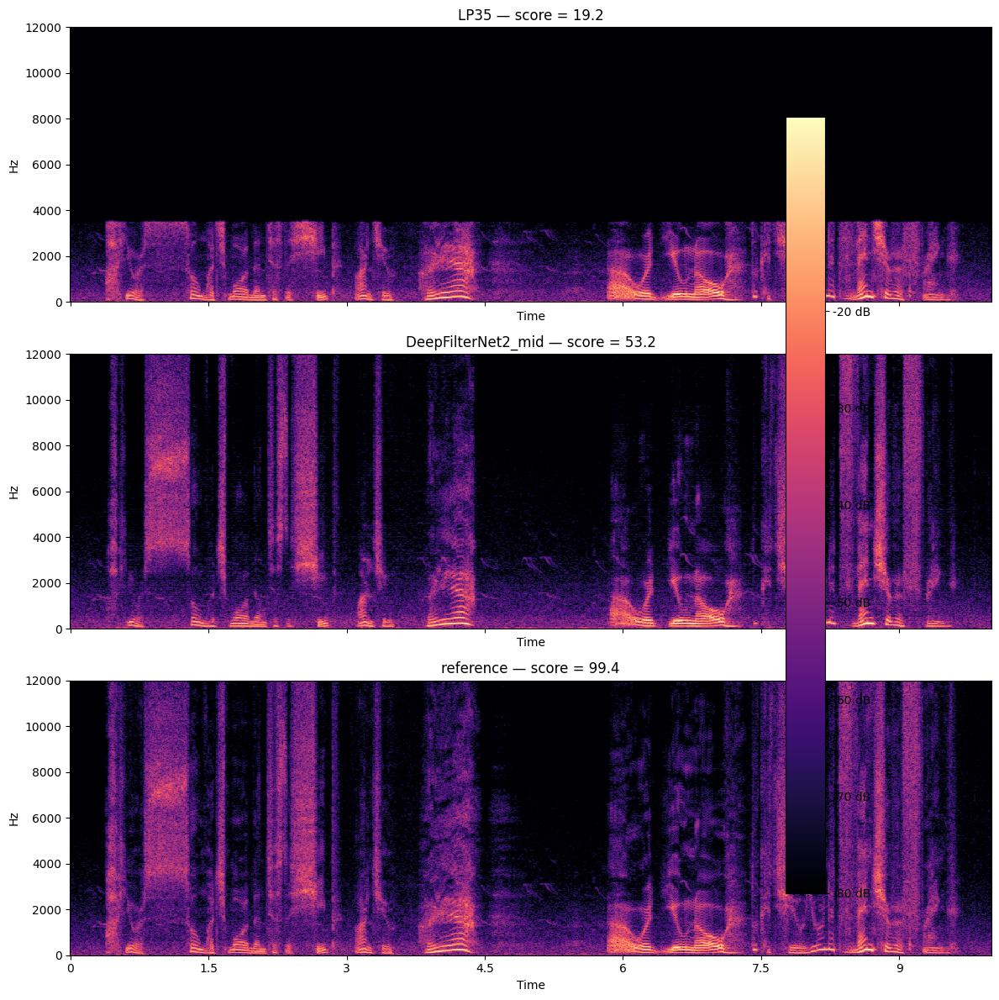

In [5]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(
    3, 1,
    figsize=(12, 12),
    sharex=True
)

for ax, (process, data) in zip(
    axes,
    comparison.items()
):
    y = data["y"]
    sr = data["sr"]
    score = data["score"]

    D = librosa.stft(
        y,
        n_fft=2048,
        hop_length=512
    )

    D_db = librosa.amplitude_to_db(
        np.abs(D),
        ref=np.max
    )

    img = librosa.display.specshow(
        D_db,
        sr=sr,
        hop_length=512,
        x_axis="time",
        y_axis="hz",
        ax=ax
    )

    ax.set_ylim(0, 12000)

    ax.set_title(
        f"{process} — score = {score:.1f}"
    )

fig.colorbar(
    img,
    ax=axes,
    format="%+2.0f dB"
)

plt.tight_layout()

plt.savefig(
    "../figures/01_spectrogram_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()